In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

Importing all important libraries

Importing data

In [2]:
df = pd.read_csv("Depth Data.csv")

print("Dataset shape:", df.shape)
print("\nFirst 5 readings:")
display(df.head())

Dataset shape: (300, 2)

First 5 readings:


,Point,Depth (m)
0,1,-263.7
1,2,-255.9
2,3,-285.7
3,4,-296.2
4,5,-269.6


Figuring it any problems with the data


In [3]:
df["Depth (m)"] = pd.to_numeric(
    df["Depth (m)"],
    errors="coerce"
)

print("Number of invalid readings:",
      df["Depth (m)"].isna().sum())

Number of invalid readings: 1


Displaying the problem

In [4]:
print("Suspicious readings:")

suspicious = df[
    (df["Depth (m)"].isna()) |
    (df["Depth (m)"] < -600) |
    (df["Depth (m)"] >= 0)
]

display(suspicious)

Suspicious readings:


,Point,Depth (m)
96,97,NaN
150,151,-1271.1
275,276,0.0


Making a copy because it is safer from experience and making it dmooth to compare
some of the values are way too random thats why we are cleaning them you can see in the graph below
fixing those values by interpolting them

In [5]:
clean_df = df.copy()

# Mark suspicious readings as missing
clean_df.loc[
    (clean_df["Depth (m)"] < -600) |
    (clean_df["Depth (m)"] >= 0),
    "Depth (m)"
] = np.nan

# Fill missing values using interpolation
clean_df["Depth (m)"] = clean_df["Depth (m)"].interpolate()

If you see the random fluction around 275s you can see that the depth randomly goes up which means it is an error by the senor so to fix it we use 
window selects 7 values and mean fun means it and centre = true puts the value in between as we know the future values but irl we cannot use it as we do not know future values
minperiod = 1 makes sure at end if there aren't 7 values then it doesn't put nan in them and just means the remaining ones



In [6]:
clean_df["Smoothed Depth"] = (
    clean_df["Depth (m)"]
    .rolling(
        window=7,
        center=True,
        min_periods=1
    )
    .mean()
)

Showing graphs
FIrst one shows smoothness effecr against the normal one

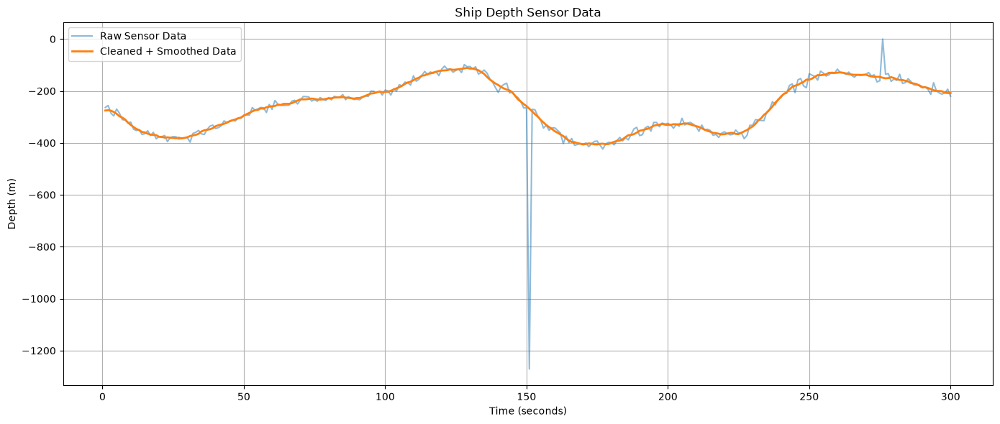

In [7]:
plt.figure(figsize=(14, 6))

plt.plot(
    df["Point"],
    df["Depth (m)"],
    label="Raw Sensor Data",
    alpha=0.5
)

plt.plot(
    clean_df["Point"],
    clean_df["Smoothed Depth"],
    label="Cleaned + Smoothed Data",
    linewidth=2
)

plt.xlabel("Time (seconds)")
plt.ylabel("Depth (m)")
plt.title("Ship Depth Sensor Data")

plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

Without comparision graph

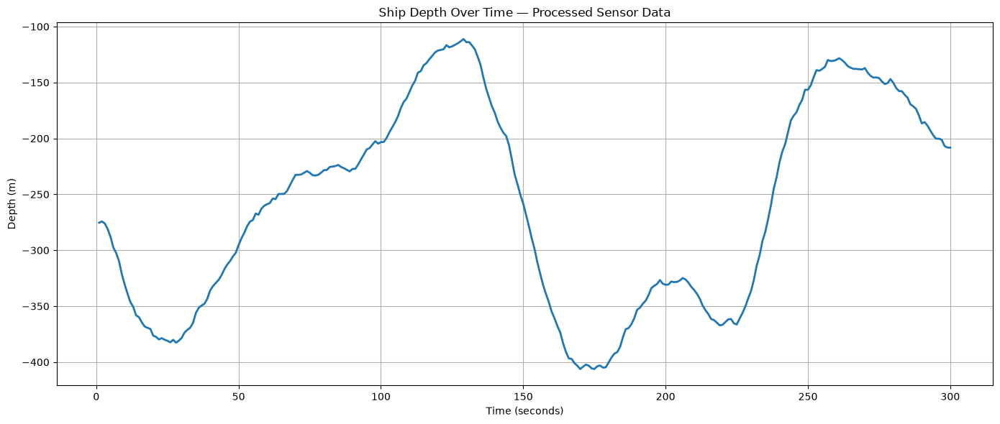

In [8]:
plt.figure(figsize=(14, 6))

plt.plot(
    clean_df["Point"],
    clean_df["Smoothed Depth"],
    linewidth=2
)

plt.xlabel("Time (seconds)")
plt.ylabel("Depth (m)")
plt.title("Ship Depth Over Time — Processed Sensor Data")

plt.grid(True)
plt.tight_layout()

plt.show()

Animation to show vs time

In [10]:
fig, ax = plt.subplots(figsize=(14, 6))

# Set graph limits
ax.set_xlim(
    clean_df["Point"].min(),
    clean_df["Point"].max()
)

ax.set_ylim(
    clean_df["Smoothed Depth"].min() - 20,
    clean_df["Smoothed Depth"].max() + 20
)

# Labels
ax.set_xlabel("Time (seconds)")
ax.set_ylabel("Depth (m)")
ax.set_title("Live Ship Depth Monitoring")

ax.grid(True)

# Empty line that will be updated
line, = ax.plot([], [], linewidth=2)


def update(frame):

    # Take all points up to the current second
    x = clean_df["Point"].iloc[:frame + 1]

    y = clean_df["Smoothed Depth"].iloc[:frame + 1]

    # Update graph
    line.set_data(x, y)

    return line,


animation = FuncAnimation(
    fig,
    update,
    frames=len(clean_df),
    interval=1000,
    blit=True
)

plt.close(fig)

HTML(animation.to_jshtml())